# Pre-Trained Neural Network Transfer Learning Example

Using the standard image repository, ImageNet, two types of images are to be downloaded and then used to train an inception architecture nerual network to distinguish between them.

The two categories being used for the example are:
- Satellites, `wnid=n04137444`
- Airplanes, `wnid=n02691156`

The chosen pre-trained network is the inception-ResNet-v2 architecture [originially described here](https://arxiv.org/abs/1602.07261) This is a cutting edge architecture with over 100 layers and implementation of residual connection to improve training performance.

Note: Set Edit>Notebook Settings>Hardware Accelerator to GPU for fastest performance.

Firstly, the proper frameworks and libraries must be installed. In Google's colaboratory, the following code can be run, but it cannot be run in a standard Jupyter notebook. It can also be run from a linux or anaconda prompt.

The library `imagenetscraper` is used to download our training data. `pydot` is needed for a dependency.

In [1]:
!pip install imagenetscraper
!pip install pydot

    100% |████████████████████████████████| 81kB 5.0MB/s 
    100% |████████████████████████████████| 4.5MB 7.1MB/s 
    100% |████████████████████████████████| 51kB 21.0MB/s 
  Running setup.py bdist_wheel for imagenetscraper ... - done
  Stored in directory: /root/.cache/pip/wheels/54/77/00/41abdbaedbcb018650e600989114f18bf0674767e367e11559
  Running setup.py bdist_wheel for frogress ... - done
  Stored in directory: /root/.cache/pip/wheels/2e/16/a3/694d34aba3db2000b4497bb0ce3f60f7c593b19c7aa465dad2
  Running setup.py bdist_wheel for grequests ... - done
  Stored in directory: /root/.cache/pip/wheels/00/3d/90/eb93eb8a1a2fdc6ce52ab85949b867beaed1e255a38a532901
Successfully built imagenetscraper frogress grequests
    100% |████████████████████████████████| 133kB 4.1MB/s 
  Running setup.py bdist_wheel for pydot ... - done
  Stored in directory: /root/.cache/pip/wheels/6a/a5/14/25541ebcdeaf97a37b6d05c7ff15f5bd20f5e91b99d313e5b4
Successfully built pydot


The next block of code is responsible for defining the `wnetid` values, and directories which will be used for either classification 1 or 0. The data is downloaded using `os` method `popen` to run the imagenetscraper scripts. This is going to be the longest block of code to execute because it's downloading like 2000 images.

In [2]:
import os

# this is the satellites sysnet
sat_id = "n04137444"
# two sysnets are used for space to get more training data
space_id = ["n08500989","n08500819"]
air_id = ["n02691156"]

# store the images here
sat_dir = "./sats/"
space_dir = "./space/"
air_dir = "./planes/"

neg_dir = air_dir

# do the downloading
print(os.popen("imagenetscraper " + sat_id +' '+ sat_dir).read())
for s in air_id:
  print(os.popen("imagenetscraper " + s +' '+ air_dir).read())

Retrieving synset target id
Retrieving image count
Retrieving synset index


  0.1% | [..........] | Progress: 1 / 1118 | Time: 0.2s | ETA: 3min36s
  0.4% | [..........] | Progress: 4 / 1118 | Time: 0.3s | ETA: 1min14s
  0.5% | [..........] | Progress: 6 / 1118 | Time: 0.3s | ETA: 58.9s
  1.0% | [..........] | Progress: 11 / 1118 | Time: 0.4s | ETA: 38.0s
  1.3% | [..........] | Progress: 14 / 1118 | Time: 0.4s | ETA: 33.9s
  1.8% | [..........] | Progress: 20 / 1118 | Time: 0.5s | ETA: 26.6s
  2.0% | [..........] | Progress: 22 / 1118 | Time: 0.5s | ETA: 26.9s
  2.2% | [..........] | Progress: 25 / 1118 | Time: 0.6s | ETA: 25.8s
  2.6% | [..........] | Progress: 29 / 1118 | Time: 0.7s | ETA: 24.5s
  2.8% | [..........] | Progress: 31 / 1118 | Time: 0.7s | ETA: 24.6s
  3.1% | [..........] | Progress: 35 / 1118 | Time: 0.8s | ETA: 23.3s
  3.4% | [..........] | Progress: 38 / 1118 | Time: 0.8s | ETA: 23.8s
  3.7% | [..........] | Progress: 41 / 1118 | Time: 0.9s | ETA: 23.4s
  4.2% | [..

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from PIL import Image
from __future__ import print_function
import keras
from keras.utils import to_categorical
import os
from keras.preprocessing.image import ImageDataGenerator, load_img

Using TensorFlow backend.


After importing all the necesary code, including `numpy` et al, the following code block chooses the training and validation data. For the purposes of demonstration, 600 images are used for training and 300 are used for validation. Examples for each class are also shown by this block. The randomization can be changed by changing `np.random.seed()`. The important variables in this code are `train_list` and `test_list`. These lists contain the relative paths to all of the training images selected. It should be noted that these lists are sorted with the first half being the positive classification cases for both.

Successfully downloaded 1118 satellite picutres and 1434 no satellite pictures


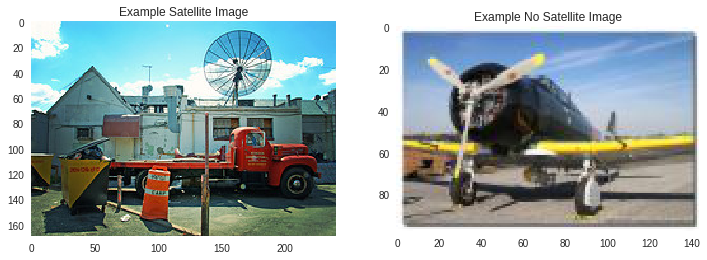

In [4]:
# get lists from the image directories
sat_l = os.listdir(sat_dir)
neg_l = os.listdir(neg_dir)

# Count our images and report
n_sat = len(sat_l)
n_space = len(neg_l)
print("Successfully downloaded {} satellite picutres and {} no satellite pictures"
     .format(n_sat,n_space))

# Training Parameters #
# Define the number of images to use for each classification
N_im = 600
# Define ratio of images for training
rTrain = 0.75
rTest = 1-rTrain
# These are the total numbers for training images
# The images will be split into half satellite images and half non-sat images
nTrain = 2*round(N_im*rTrain)
nTest  = 2*round(N_im*rTest)

# Randomizing
np.random.seed(1)

# These are the indices used for training images
ind_sat = np.random.permutation(n_sat)[0:N_im]
ind_space = np.random.permutation(n_space)[0:N_im]

train_list = ([sat_dir + f for f in np.array(sat_l)[ind_sat[:nTrain//2]]] +
              [neg_dir + f for f in np.array(neg_l)[ind_space[:nTrain//2]]])

test_list  = ([sat_dir + f for f in np.array(sat_l)[ind_sat[nTrain//2:]]] +
              [neg_dir + f for f in np.array(neg_l)[ind_space[nTrain//2:]]])


# Plot the example images here
# Where the example images will be the first of the ordered images
fig,ax = plt.subplots(1,2,figsize=(12,6))
plt.subplot(1,2,1)
plt.grid('off')
plt.title("Example Satellite Image")
im = Image.open(sat_dir+sat_l[ind_sat[0]])
plt.imshow(im);

# Example of negative image
plt.subplot(1,2,2)
plt.grid('off')
plt.title("Example No Satellite Image")
im = Image.open(neg_dir+neg_l[ind_space[0]])
plt.imshow(im);




# Pre-Trained Network Setup & Feature Extraction

The next code block downloads the Pre-trained network configuration and weights.  Luckily the chosen network is included in keras, so this process if fairly straightforward. The code also displays a summary of the network's layers.

In [5]:
from keras.applications.inception_resnet_v2 import InceptionResNetV2

# Note that the input_shape chosen here is to help with future datasets
inc_conv = InceptionResNetV2(weights='imagenet',
                  include_top=False,
                  input_shape=(256, 256, 3))

# Display layer information for reference
inc_conv.summary()

219062272/219055592 [==============================] - 3s 0us/step
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 127, 127, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 127, 127, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 127, 127, 32) 0           batch_normalization_1[0][0]      
__________________________________________

This is the part where we extract the features and use incpetion resnet. First the data generator settings and the batch size is defined.

The next block generates batches of training data. The feature array output by the feature detector network (The Inception-ResNet-v2 architecture) is of size 6 by 6 by 1536 for each image. These dimensions are flattened in the output because the classifier network will work on 1D data.

The subsequent block does the same for validation data.

In [0]:
datagen = ImageDataGenerator(rescale=1./255)
batch_size = 20
epochs = 50

In [7]:
x_train = np.array([np.array(Image.open(fname).resize((256,256)).convert("RGB")) 
                    for fname in train_list])
y_train = np.concatenate((np.ones(nTrain//2), np.zeros(nTrain//2)))

# print(x_train.shape)

train_generator = datagen.flow(x_train, y_train, batch_size=batch_size)

train_features = np.zeros(shape=(nTrain, 6, 6, 1536))
train_labels = np.zeros(shape=(nTrain))

i = 0
for inputs_batch, labels_batch in train_generator:
    print("Working on training batch {}".format(i))
    features_batch = inc_conv.predict(inputs_batch)
    if ((i+1) * batch_size < nTrain):
      train_features[i * batch_size : (i + 1) * batch_size] = features_batch
      train_labels[i * batch_size : (i + 1) * batch_size] = labels_batch
    else:
      train_features[i * batch_size : ] = features_batch[0:nTrain-i*batch_size]
      train_labels[i * batch_size : ] = labels_batch[0:nTrain-i*batch_size]
    i += 1
    if i * batch_size >= nTrain:
        break
        
train_features = np.reshape(train_features, (nTrain, 6 * 6 * 1536))

Working on training batch 0
Working on training batch 1
Working on training batch 2
Working on training batch 3
Working on training batch 4
Working on training batch 5
Working on training batch 6
Working on training batch 7
Working on training batch 8
Working on training batch 9
Working on training batch 10
Working on training batch 11
Working on training batch 12
Working on training batch 13
Working on training batch 14
Working on training batch 15
Working on training batch 16
Working on training batch 17
Working on training batch 18
Working on training batch 19
Working on training batch 20
Working on training batch 21
Working on training batch 22
Working on training batch 23
Working on training batch 24
Working on training batch 25
Working on training batch 26
Working on training batch 27
Working on training batch 28
Working on training batch 29
Working on training batch 30
Working on training batch 31
Working on training batch 32
Working on training batch 33
Working on training batc

In [8]:
x_test = np.array([np.array(Image.open(fname).resize((256,256)).convert("RGB")) 
                   for fname in test_list])
y_test = np.concatenate((np.ones(nTest//2), np.zeros(nTest//2)))

print(x_test[0].shape)

test_generator = datagen.flow(x_test, y_test, batch_size=batch_size)

test_features = np.zeros(shape=(nTest, 6, 6, 1536))
test_inputs = np.zeros(shape=(nTest, 256, 256, 3))
test_labels = np.zeros(shape=(nTest))

i = 0
for inputs_batch, labels_batch in test_generator:
    print("Working on test batch {}".format(i))
    features_batch = inc_conv.predict(inputs_batch)
    if((i+1)*batch_size < nTest):
      test_inputs[i * batch_size : (i + 1) * batch_size] = inputs_batch
      test_features[i * batch_size : (i + 1) * batch_size] = features_batch
      test_labels[i * batch_size : (i + 1) * batch_size] = labels_batch
    else:
      test_features[i * batch_size : ] = features_batch[0:nTest-i*batch_size]
      test_labels[i * batch_size : ] = labels_batch[0:nTest-i*batch_size]
    i += 1
    if i * batch_size >= nTest:
        break
        
test_features = np.reshape(test_features, (nTest, 6 * 6 * 1536))

(256, 256, 3)
Working on test batch 0
Working on test batch 1
Working on test batch 2
Working on test batch 3
Working on test batch 4
Working on test batch 5
Working on test batch 6
Working on test batch 7
Working on test batch 8
Working on test batch 9
Working on test batch 10
Working on test batch 11
Working on test batch 12
Working on test batch 13
Working on test batch 14


# Building the Classifier Network

Next we must implement our own classifier network to be trained on the data. Luckily, using Keras functions, this processes is fairly straightforward.

The first block of code defines several metrics which will be used to gauge the network's performance. Included in this is the F1 score, which is a comprehensive measure of the network's performance on both true positives and false positives.

In [0]:
#Do some metrics huh
from keras import backend as K

def recall(y_true, y_pred):
    """Recall metric.

    Only computes a batch-wise average of recall.

    Computes the recall, a metric for multi-label classification of
    how many relevant items are selected.
    """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision(y_true, y_pred):
    """Precision metric.

    Only computes a batch-wise average of precision.

    Computes the precision, a metric for multi-label classification of
    how many selected items are relevant.
    """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1(y_true, y_pred):
    """ F1 metric.
    The F1 metric is the marmonic mean of precision and recall
    """
    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2*((p*r)/(p+r+K.epsilon()))

The next code block sets up and trains the classifier network. This simple classifier network only have input, hidden layer, dropout, and output layers. The input layer corresponds to the the 5 by 5 by 1536 array generated by the feature detector network, which was flattened earlier. These features are used to determine the values of the hidden layer which has 256 neurons. The following layer to this is a dropout layer. this dropout unit randomly ignores half of the values from the hidden layer. This is useful for preventing overfitting. The output layer is just a single neuron with a sigmoid activation. A sigmoid activation is used here because its output can be interpreted as a probability that the image is a satellite.

Other options specified here are in the last two lines of the code. First, the model was copiled and several options were chosen. The chosen optimizer is known as RMSprop which is known to have very good learning characteristics. The `lr` variabile passed to this stands for learning rate and simply paramaterizes how quickly the network attempts to change weight values by during training. The loss function was specified as a binary, cross-entropy loss becase this is also known to yield good learning values. Metrics that will be recorded are specified as accuracy, recall, and F1 score.

In the last line, training settings defined above are passed to the `fit()` method. Namely a batch size of 20 images and a total epoch count of 50.

In [10]:
#Make this thang
from keras import models
from keras import layers
from keras import optimizers
 
# Sequential is the typical model structure
model = models.Sequential()
# The input layer is dense, or fully connected
model.add(layers.Dense(256, activation='relu', input_dim=6 * 6 * 1536))
# Dropout layer prevents overfitting
model.add(layers.Dropout(0.5))
# Output layer is a single neuron sigmoid
model.add(layers.Dense(1, activation='sigmoid'))

# Model options including metrics and loss function
model.compile(optimizer=optimizers.RMSprop(lr=2e-4),
              loss='binary_crossentropy',
              metrics=['acc',recall,f1])

# Fit this to our data please!
history = model.fit(train_features,
                    train_labels,
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(test_features,test_labels))

Train on 900 samples, validate on 300 samples
Epoch 1/50
900/900 [==============================] - 4s 5ms/step - loss: 1.5205 - acc: 0.8522 - recall: 0.8970 - f1: 0.8500 - val_loss: 0.3522 - val_acc: 0.9500 - val_recall: 0.9600 - val_f1: 0.9485
Epoch 2/50
900/900 [==============================] - 1s 1ms/step - loss: 0.5280 - acc: 0.9256 - recall: 0.9306 - f1: 0.9213 - val_loss: 0.2262 - val_acc: 0.9600 - val_recall: 0.9423 - val_f1: 0.9569
Epoch 3/50
900/900 [==============================] - 1s 1ms/step - loss: 0.2653 - acc: 0.9567 - recall: 0.9585 - f1: 0.9545 - val_loss: 0.2421 - val_acc: 0.9700 - val_recall: 1.0000 - val_f1: 0.9699
Epoch 4/50
900/900 [==============================] - 1s 1ms/step - loss: 0.1693 - acc: 0.9689 - recall: 0.9714 - f1: 0.9685 - val_loss: 0.4680 - val_acc: 0.9367 - val_recall: 1.0000 - val_f1: 0.9368
Epoch 5/50
900/900 [==============================] - 1s 1ms/step - loss: 0.1767 - acc: 0.9556 - recall: 0.9682 - f1: 0.9538 - val_loss: 0.1680 - val_acc:

# Characterizing the Classifications

The first block of code for verifying network performance simply plots the information stored during the training process. There are plots for the metrics tracked in training, accuracy, recall, F1, as well as loss. 

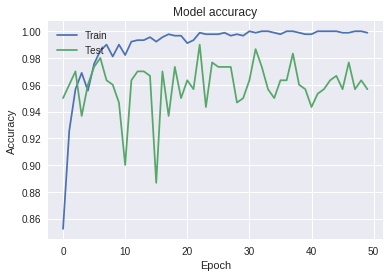

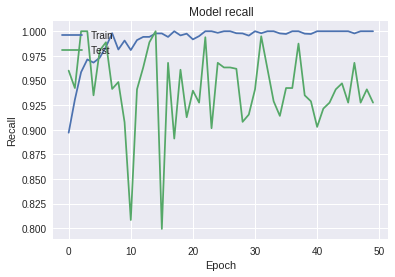

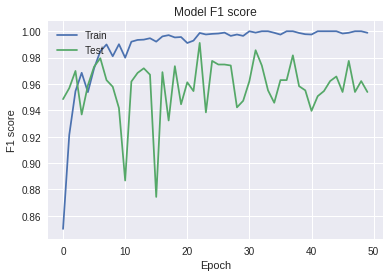

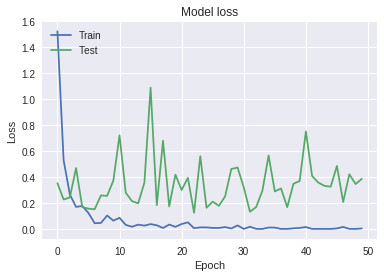

OSError: ignored

In [11]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

plt.plot(history.history['recall'])
plt.plot(history.history['val_recall'])
plt.title('Model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

plt.plot(history.history['f1'])
plt.plot(history.history['val_f1'])
plt.title('Model F1 score')
plt.ylabel('F1 score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

from keras.utils import plot_model
plot_model(model, to_file='model.png')

This next section goes over errors in the validation data and displays a bunch of example images. 

In [17]:
# fnames = test_generator.filenames
 
ground_truth = test_labels
predictions = model.predict(test_features).reshape((300,))
# prob = model.predict(test_features)
 
errors = np.where((predictions>0.5) != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),nTest))

# Some old debug
# print(predictions.reshape((300,)).shape,ground_truth.shape)
# print(errors)
# # print((predictions>0.5)[0:10],ground_truth[0:10])
# print(predictions[64], ground_truth[64])


No of errors = 13/300


Classification:1.0, Prediction: 0.000


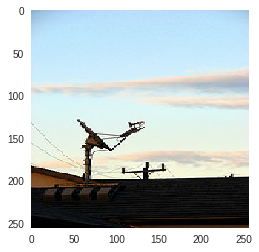

Classification:1.0, Prediction: 0.020


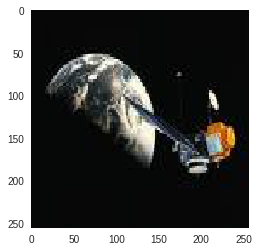

Classification:0.0, Prediction: 1.000


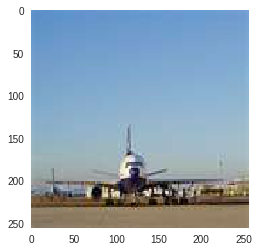

Classification:1.0, Prediction: 0.124


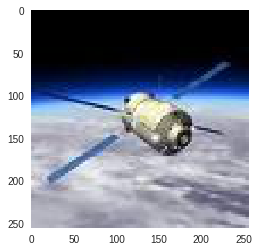

Classification:0.0, Prediction: 0.996


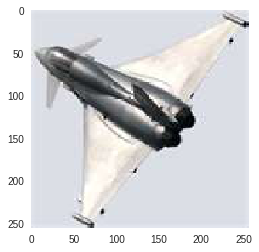

Classification:1.0, Prediction: 0.000


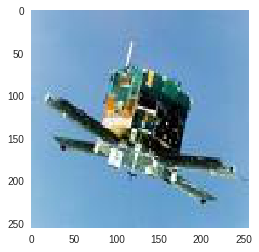

Classification:1.0, Prediction: 0.000


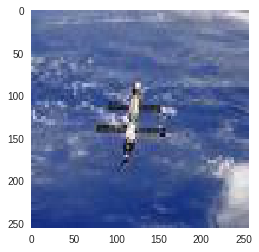

Classification:1.0, Prediction: 0.362


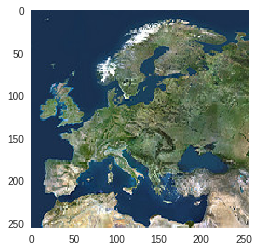

Classification:0.0, Prediction: 0.999


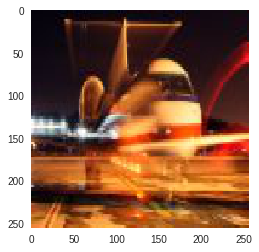

Classification:0.0, Prediction: 0.815


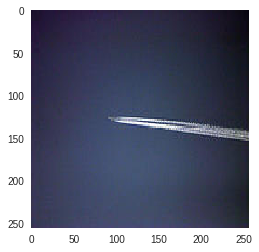

Classification:1.0, Prediction: 0.000


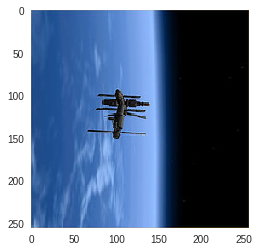

Classification:0.0, Prediction: 0.967


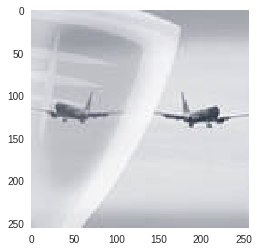

Classification:1.0, Prediction: 0.020


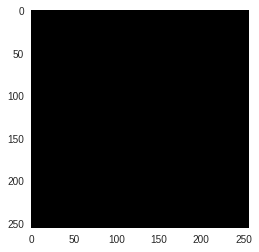

Classification:1.0, Prediction: 1.000


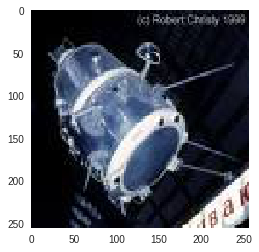

Classification:1.0, Prediction: 1.000


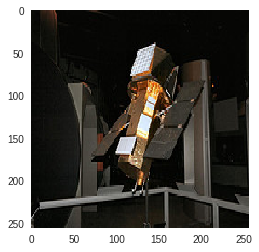

Classification:0.0, Prediction: 0.000


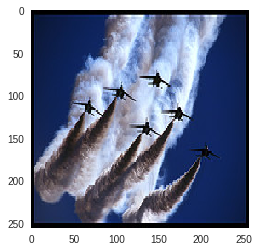

Classification:0.0, Prediction: 0.000


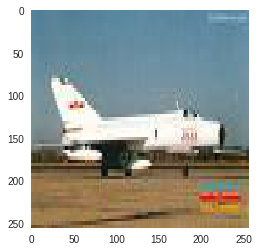

Classification:1.0, Prediction: 1.000


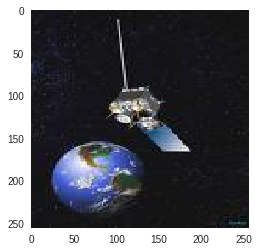

Classification:0.0, Prediction: 0.000


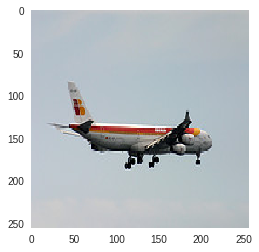

Classification:1.0, Prediction: 1.000


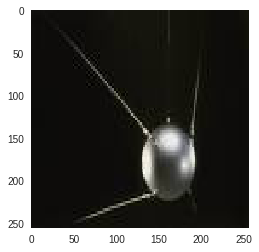

Classification:0.0, Prediction: 0.000


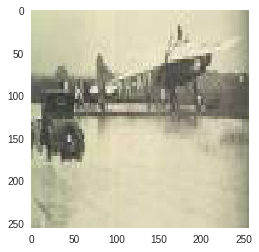

Classification:1.0, Prediction: 0.000


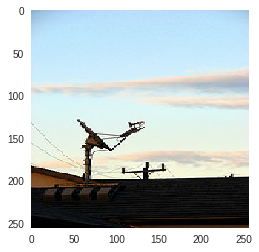

Classification:0.0, Prediction: 0.000


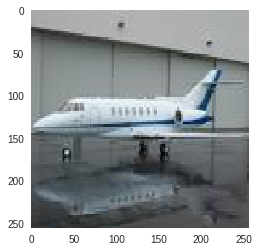

Classification:0.0, Prediction: 0.000


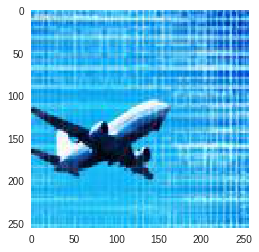

Classification:0.0, Prediction: 0.000


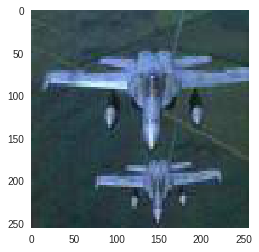

Classification:1.0, Prediction: 1.000


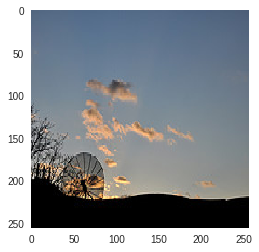

Classification:0.0, Prediction: 0.000


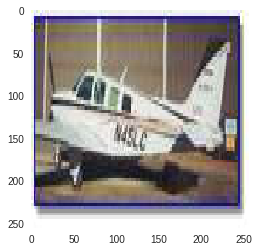

Classification:0.0, Prediction: 0.000


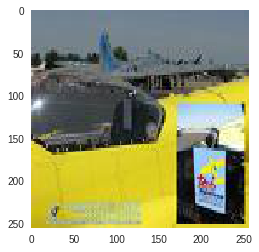

Classification:1.0, Prediction: 1.000


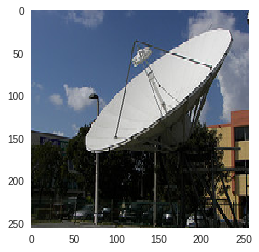

Classification:1.0, Prediction: 1.000


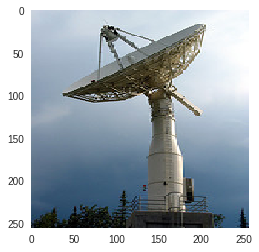

Classification:1.0, Prediction: 1.000


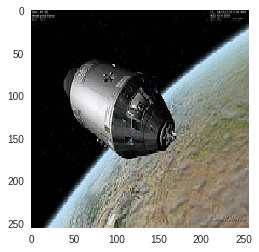

Classification:0.0, Prediction: 0.000


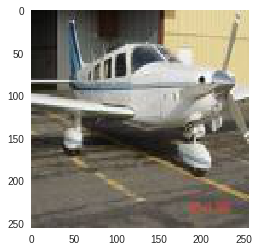

Classification:0.0, Prediction: 0.000


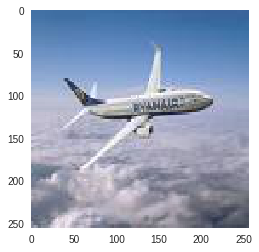

Classification:0.0, Prediction: 0.000


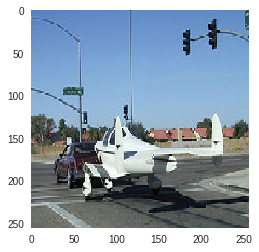

Classification:1.0, Prediction: 1.000


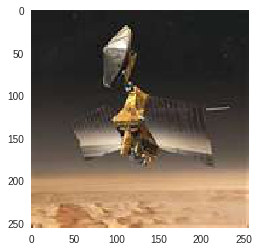

Classification:0.0, Prediction: 0.000


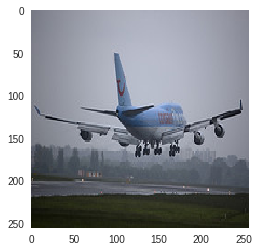

Classification:0.0, Prediction: 0.000


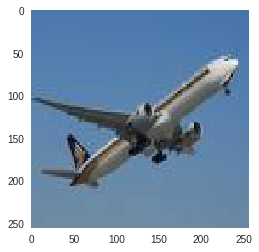

Classification:0.0, Prediction: 0.000


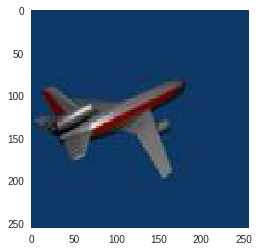

Classification:1.0, Prediction: 1.000


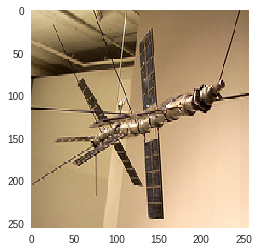

Classification:1.0, Prediction: 1.000


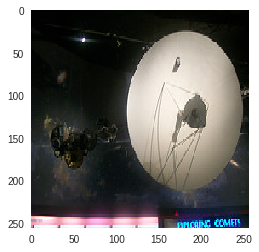

Classification:1.0, Prediction: 1.000


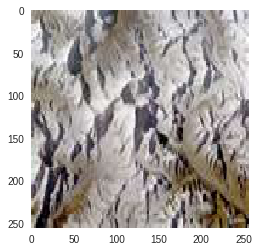

Classification:1.0, Prediction: 0.020


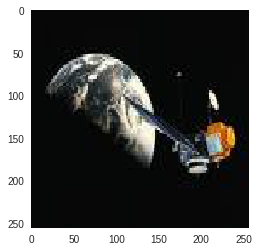

Classification:0.0, Prediction: 0.000


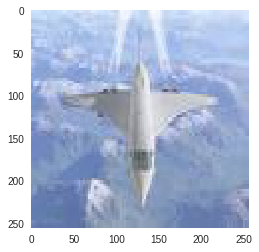

Classification:1.0, Prediction: 1.000


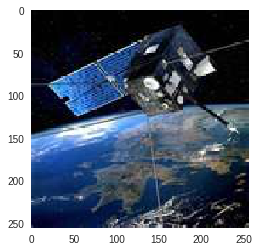

Classification:0.0, Prediction: 0.000


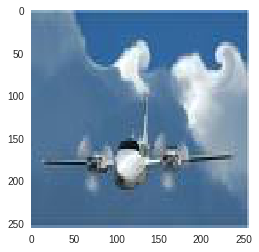

Classification:0.0, Prediction: 0.000


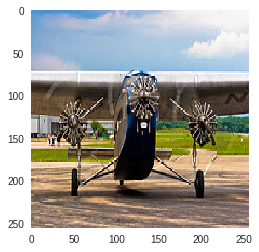

Classification:1.0, Prediction: 1.000


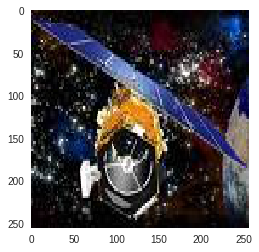

Classification:1.0, Prediction: 1.000


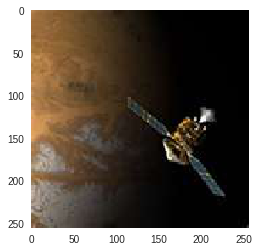

Classification:0.0, Prediction: 0.000


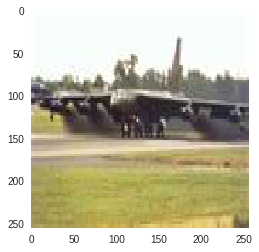

Classification:0.0, Prediction: 0.000


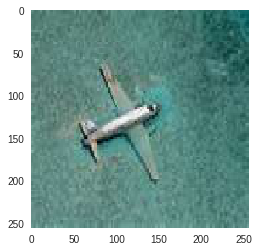

Classification:0.0, Prediction: 0.000


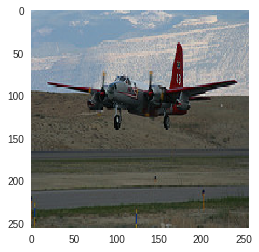

Classification:1.0, Prediction: 1.000


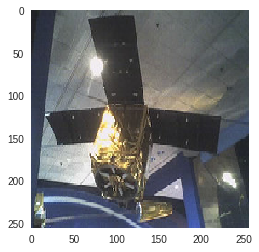

Classification:0.0, Prediction: 0.000


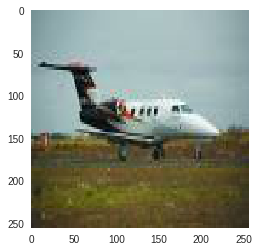

Classification:1.0, Prediction: 1.000


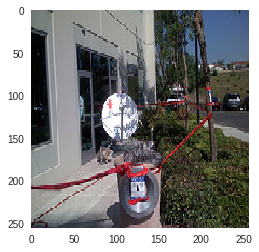

Classification:0.0, Prediction: 0.000


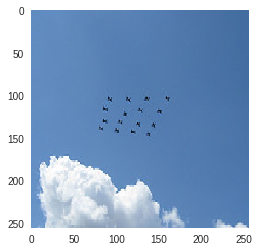

Classification:1.0, Prediction: 1.000


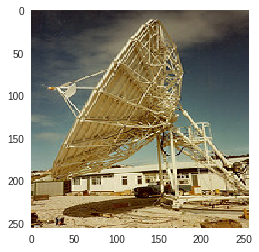

Classification:1.0, Prediction: 1.000


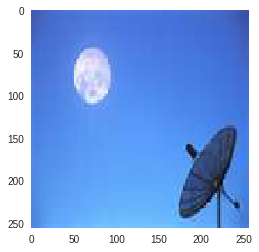

Classification:1.0, Prediction: 1.000


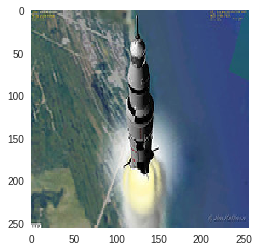

Classification:1.0, Prediction: 1.000


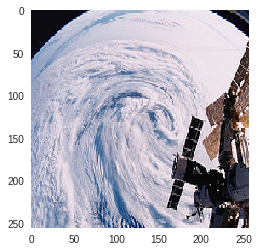

Classification:0.0, Prediction: 0.000


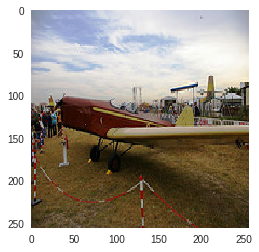

Classification:0.0, Prediction: 0.000


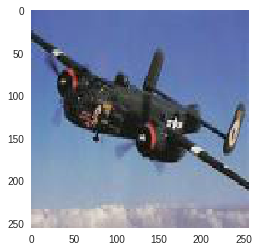

Classification:0.0, Prediction: 0.000


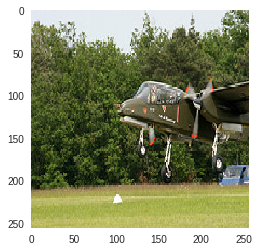

Classification:1.0, Prediction: 1.000


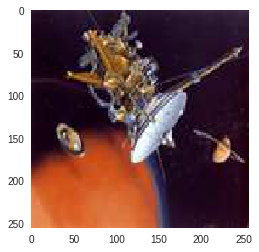

In [19]:
from itertools import chain
images = chain(errors,range(50))

for i in images:
#     pred_class = np.argmax(prob[errors[i]])
#     pred_label = idx2label[pred_class]
     
    print('Classification:{}, Prediction: {:.3f}'.format(
        ground_truth[i],
        predictions[i]))
     
    plt.imshow(test_inputs[i])
    plt.grid('off')
    plt.show()

The following is inteded to test an integrated classify images function and measure its speed.

Original Label:True, Prediction:[[0.]]


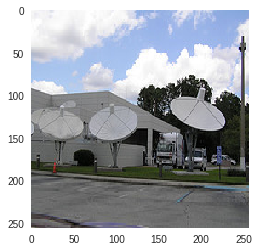

Original Label:True, Prediction:[[0.]]


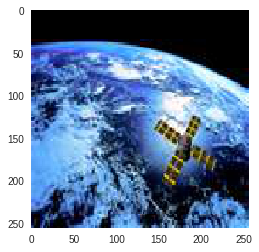

Original Label:True, Prediction:[[0.]]


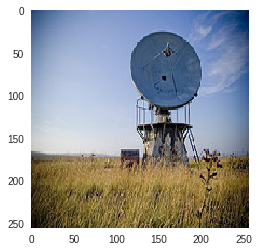

Original Label:True, Prediction:[[0.]]


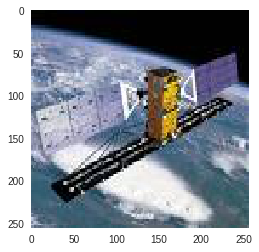

Original Label:True, Prediction:[[0.]]


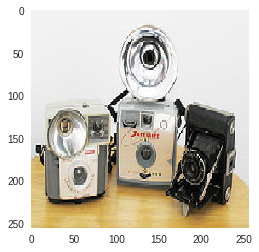

Original Label:True, Prediction:[[1.]]


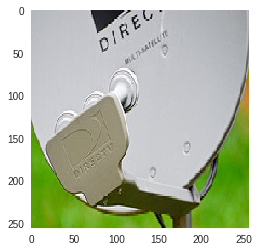

Original Label:True, Prediction:[[0.]]


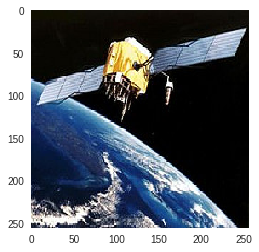

Original Label:True, Prediction:[[0.]]


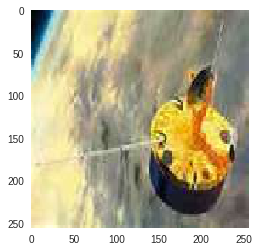

Original Label:True, Prediction:[[1.]]


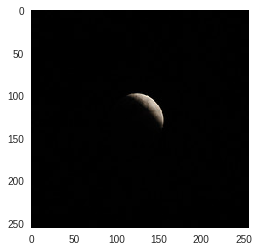

Original Label:True, Prediction:[[0.]]


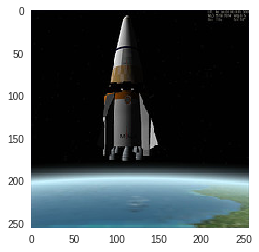

Original Label:False, Prediction:[[0.]]


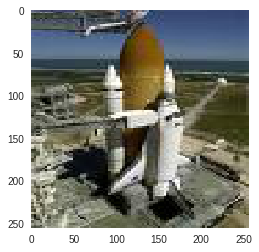

Original Label:False, Prediction:[[0.]]


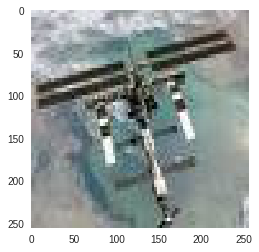

Original Label:False, Prediction:[[1.]]


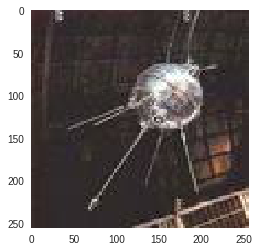

Original Label:False, Prediction:[[0.]]


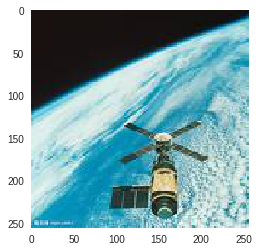

Original Label:False, Prediction:[[0.]]


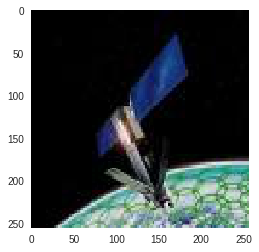

Original Label:False, Prediction:[[0.]]


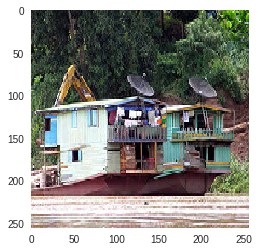

Original Label:False, Prediction:[[0.]]


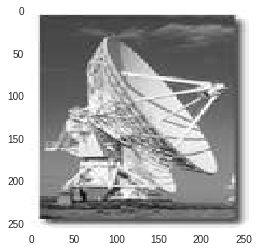

Original Label:False, Prediction:[[0.]]


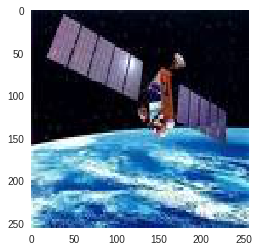

Original Label:False, Prediction:[[0.]]


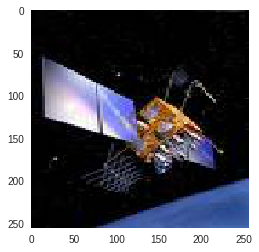

Original Label:False, Prediction:[[0.]]


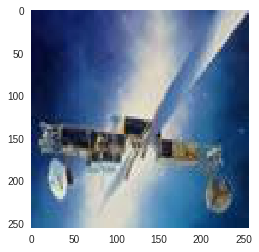

Original Label:False, Prediction:[[0.]]


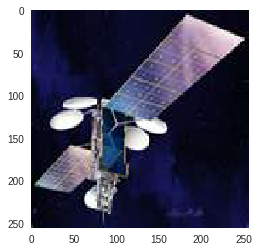

Original Label:False, Prediction:[[0.]]


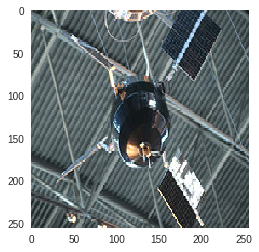

Original Label:False, Prediction:[[0.]]


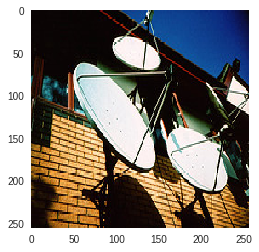

Original Label:False, Prediction:[[0.]]


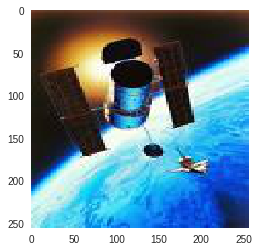

Original Label:False, Prediction:[[1.]]


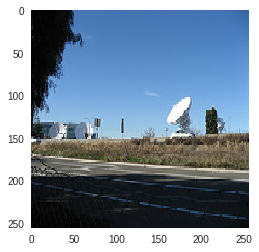

Original Label:False, Prediction:[[0.]]


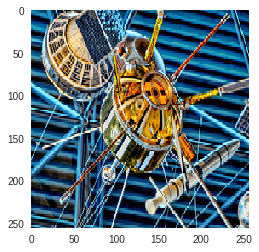

Original Label:False, Prediction:[[0.]]


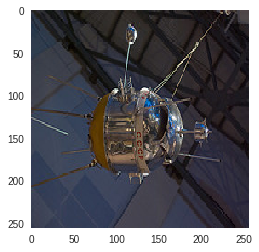

Original Label:False, Prediction:[[1.0522313e-11]]


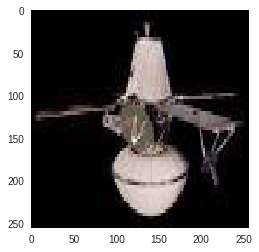

Original Label:False, Prediction:[[0.]]


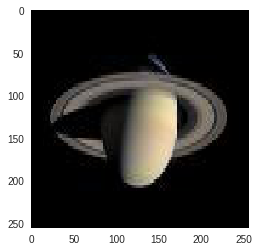

Original Label:False, Prediction:[[0.]]


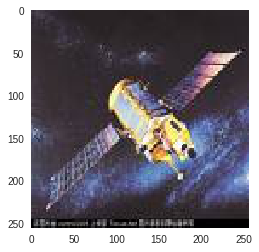

Original Label:False, Prediction:[[0.]]


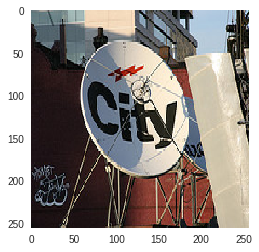

Original Label:False, Prediction:[[1.]]


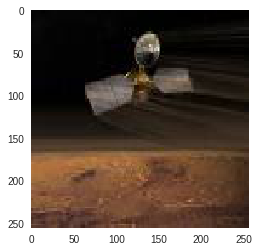

Original Label:False, Prediction:[[0.]]


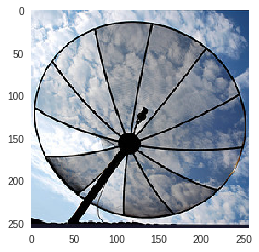

Original Label:False, Prediction:[[0.]]


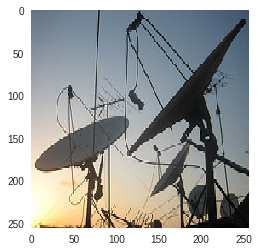

Original Label:False, Prediction:[[0.]]


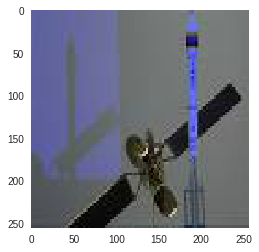

Original Label:False, Prediction:[[0.]]


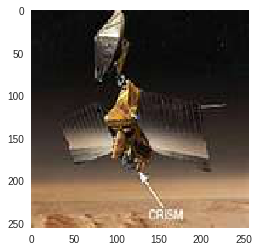

Original Label:False, Prediction:[[0.]]


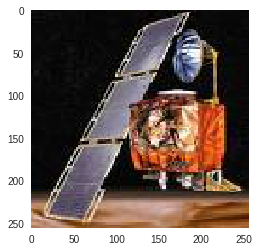

Original Label:False, Prediction:[[0.]]


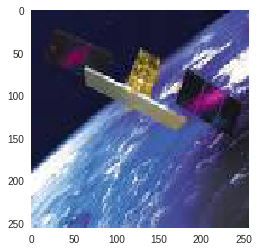

Original Label:False, Prediction:[[0.]]


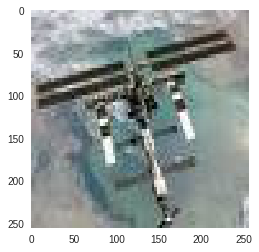

Original Label:False, Prediction:[[0.]]


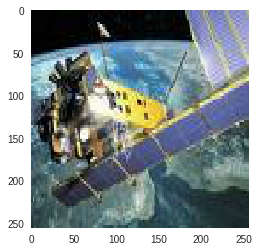

Original Label:False, Prediction:[[0.]]


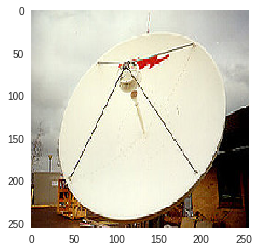

Original Label:False, Prediction:[[0.]]


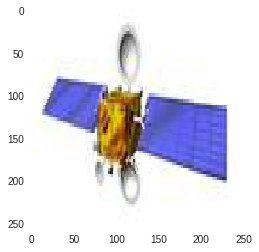

Original Label:False, Prediction:[[1.]]


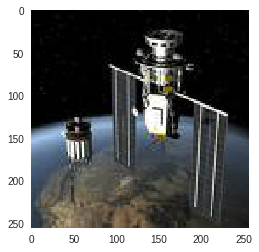

Original Label:False, Prediction:[[1.]]


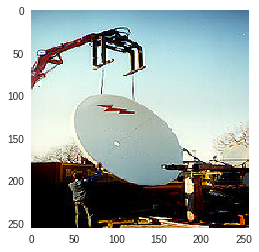

Original Label:False, Prediction:[[1.]]


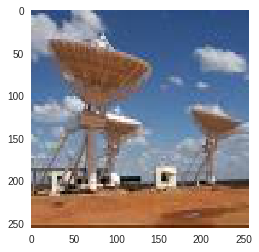

Original Label:False, Prediction:[[1.]]


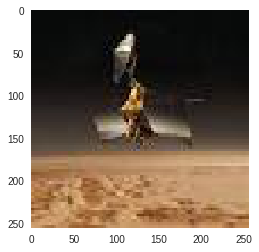

Original Label:False, Prediction:[[0.]]


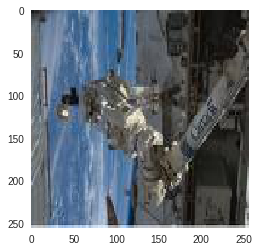

Original Label:False, Prediction:[[1.]]


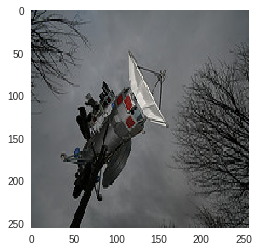

Original Label:False, Prediction:[[0.]]


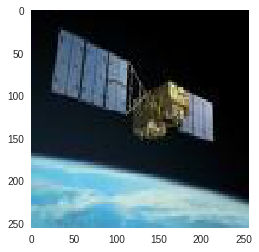

Original Label:False, Prediction:[[0.]]


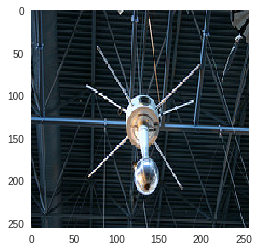

Original Label:False, Prediction:[[0.]]


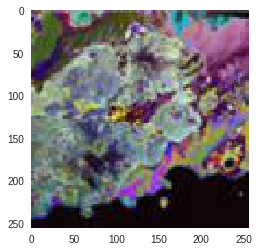

Original Label:False, Prediction:[[0.]]


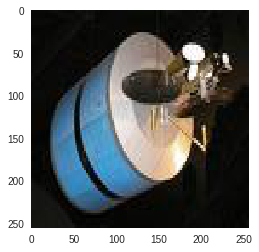

Original Label:False, Prediction:[[0.]]


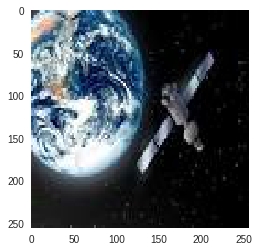

Original Label:False, Prediction:[[0.]]


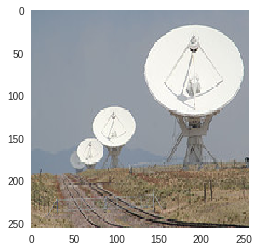

Original Label:False, Prediction:[[1.]]


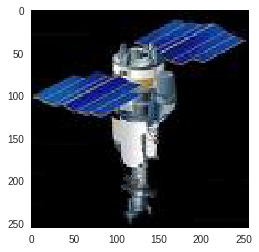

Original Label:False, Prediction:[[0.]]


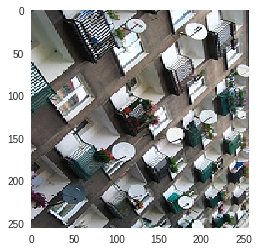

Original Label:False, Prediction:[[0.]]


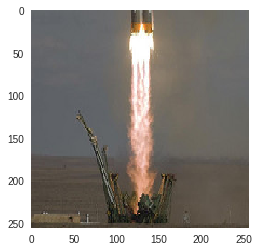

Original Label:False, Prediction:[[0.]]


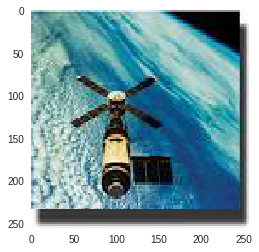

Original Label:False, Prediction:[[0.]]


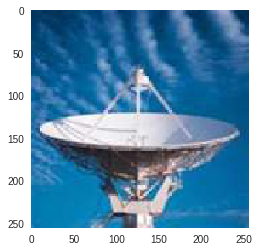

Original Label:False, Prediction:[[1.]]


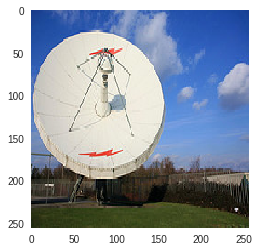

Original Label:False, Prediction:[[1.1017166e-32]]


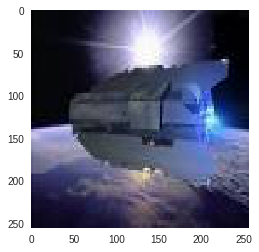

Original Label:False, Prediction:[[0.]]


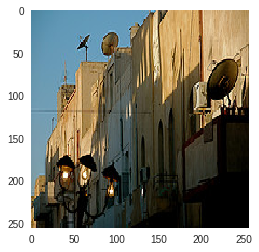

Original Label:False, Prediction:[[1.]]


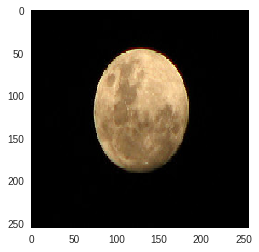

Original Label:False, Prediction:[[0.]]


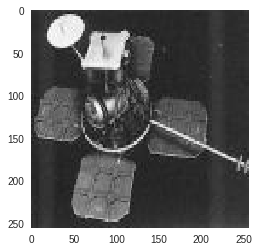

Original Label:False, Prediction:[[1.]]


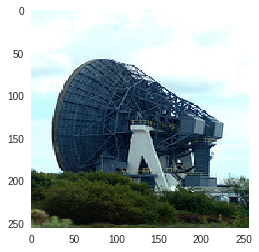

Original Label:False, Prediction:[[0.]]


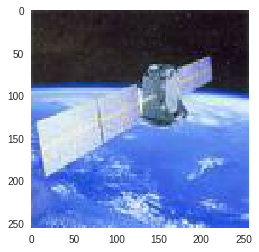

Original Label:False, Prediction:[[0.]]


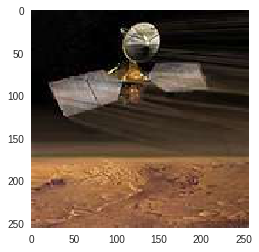

Original Label:False, Prediction:[[0.]]


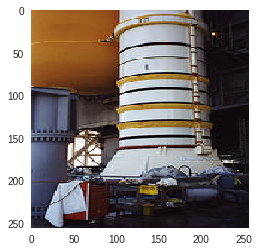

Original Label:False, Prediction:[[1.]]


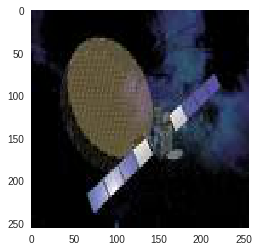

Original Label:False, Prediction:[[0.]]


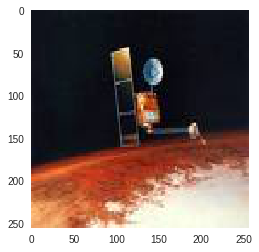

Original Label:False, Prediction:[[0.]]


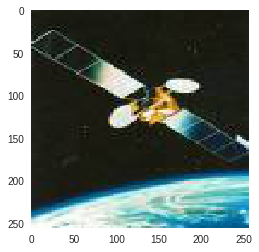

Original Label:False, Prediction:[[0.]]


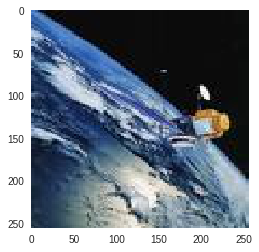

Original Label:False, Prediction:[[0.]]


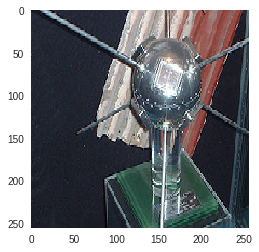

Original Label:False, Prediction:[[0.9999999]]


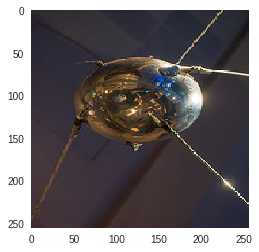

Original Label:False, Prediction:[[0.]]


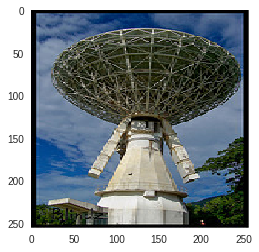

Original Label:False, Prediction:[[0.]]


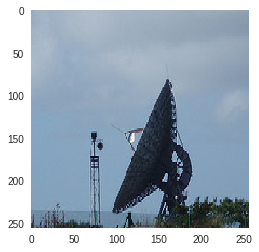

Original Label:False, Prediction:[[0.]]


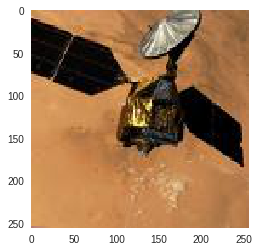

Original Label:False, Prediction:[[0.]]


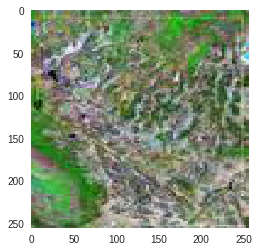

Original Label:False, Prediction:[[0.]]


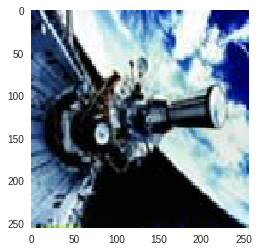

Original Label:False, Prediction:[[0.]]


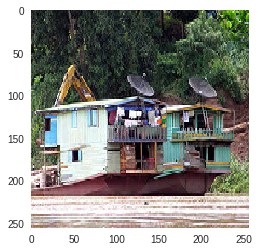

Original Label:False, Prediction:[[0.]]


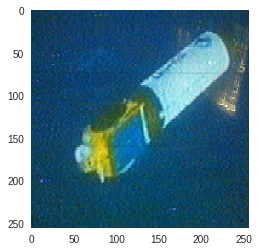

Original Label:False, Prediction:[[0.]]


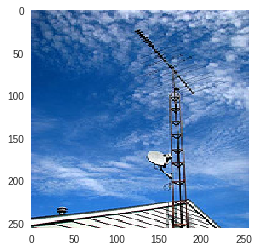

Original Label:False, Prediction:[[0.]]


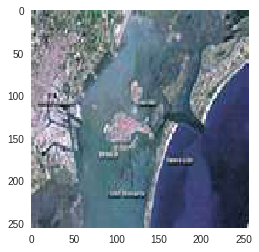

Original Label:False, Prediction:[[0.]]


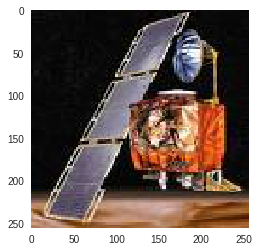

Original Label:False, Prediction:[[1.]]


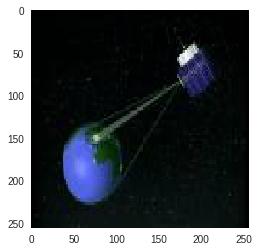

Original Label:False, Prediction:[[0.]]


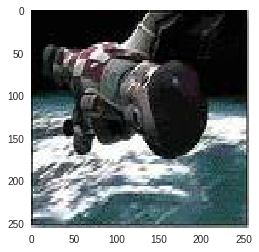

Original Label:False, Prediction:[[0.]]


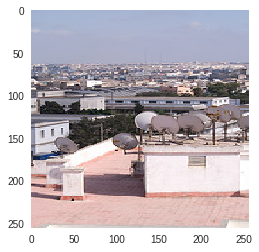

Original Label:False, Prediction:[[0.]]


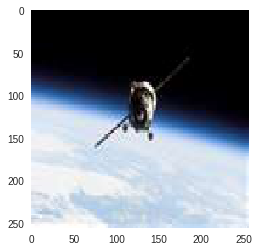

Original Label:False, Prediction:[[0.]]


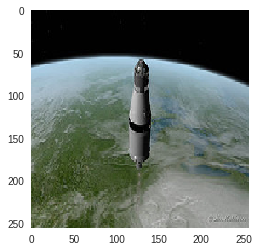

Original Label:False, Prediction:[[0.]]


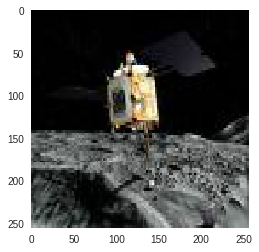

Original Label:False, Prediction:[[0.]]


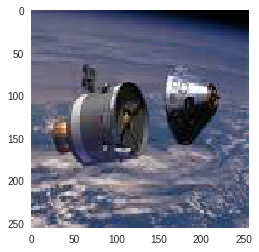

Original Label:False, Prediction:[[0.]]


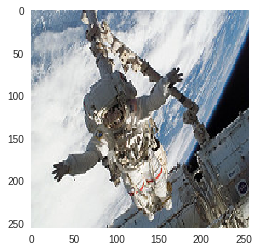

Original Label:False, Prediction:[[0.]]


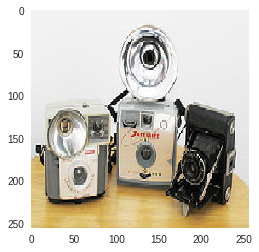

Original Label:False, Prediction:[[0.]]


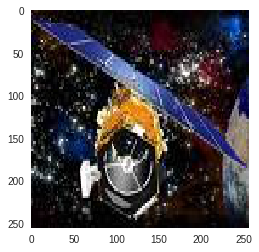

Original Label:False, Prediction:[[0.]]


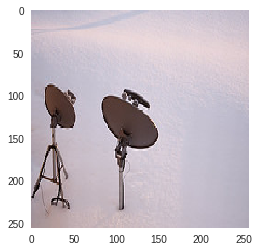

Original Label:False, Prediction:[[0.]]


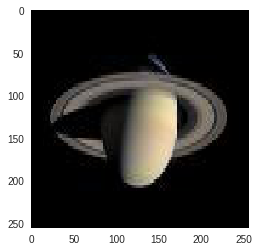

Original Label:False, Prediction:[[0.]]


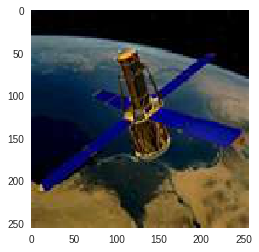

Original Label:False, Prediction:[[0.]]


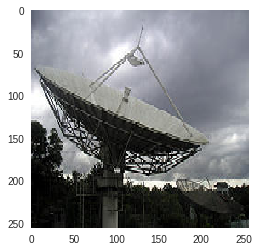

Original Label:False, Prediction:[[0.]]


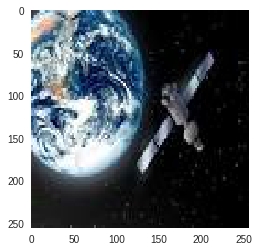

Original Label:False, Prediction:[[8.804662e-38]]


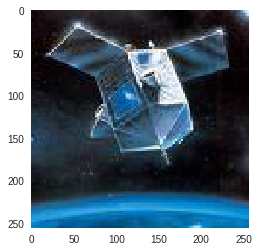

Original Label:False, Prediction:[[0.]]


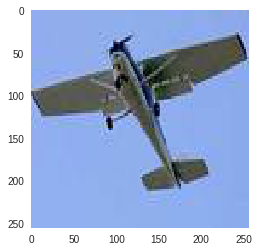

Original Label:False, Prediction:[[1.]]


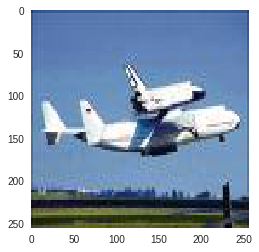

Original Label:False, Prediction:[[1.]]


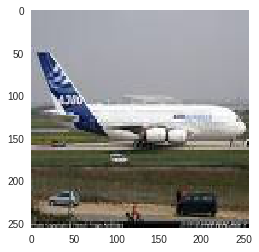

Original Label:False, Prediction:[[0.]]


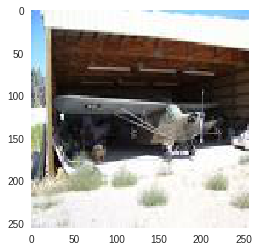

Original Label:False, Prediction:[[0.]]


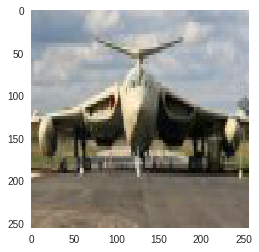

Original Label:False, Prediction:[[0.]]


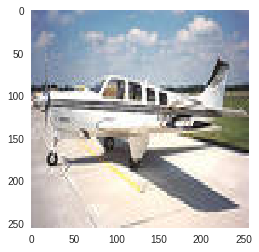

Original Label:False, Prediction:[[0.]]


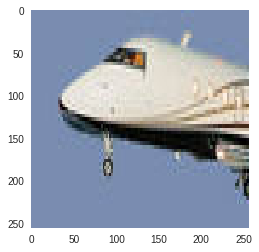

Original Label:False, Prediction:[[0.]]


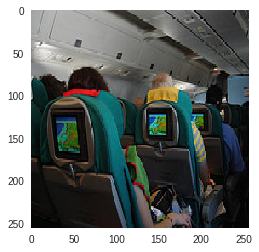

Original Label:False, Prediction:[[1.]]


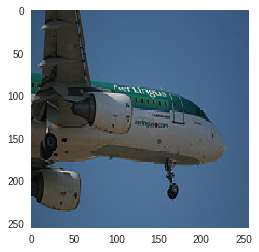

Original Label:False, Prediction:[[1.]]


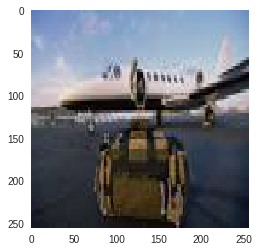

Original Label:False, Prediction:[[1.]]


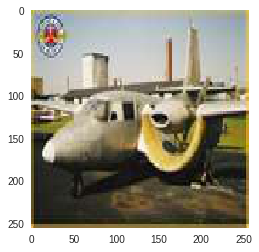

Original Label:False, Prediction:[[3.6858327e-23]]


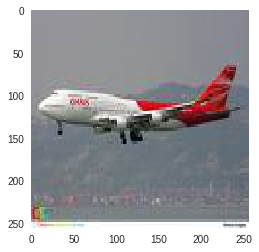

Original Label:False, Prediction:[[0.]]


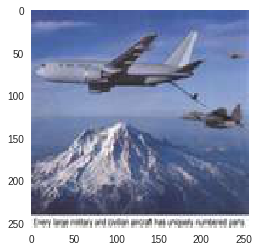

Original Label:False, Prediction:[[0.]]


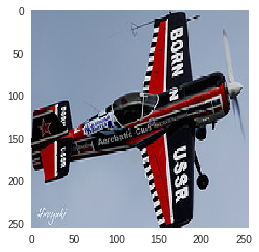

Original Label:False, Prediction:[[0.]]


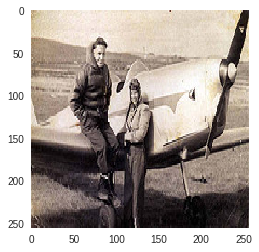

Original Label:False, Prediction:[[1.]]


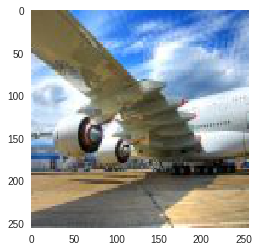

Original Label:False, Prediction:[[0.]]


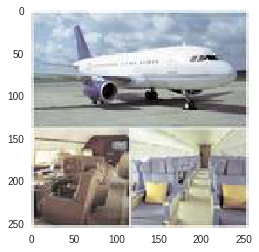

Original Label:False, Prediction:[[1.]]


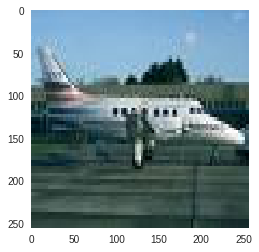

Original Label:False, Prediction:[[0.]]


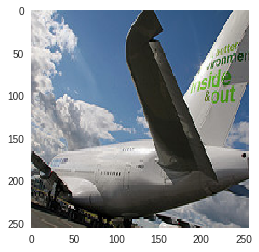

Original Label:False, Prediction:[[0.]]


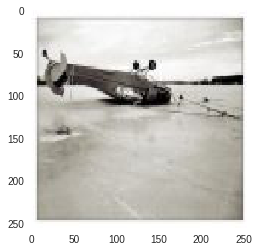

Original Label:False, Prediction:[[1.]]


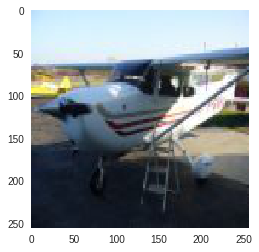

Original Label:False, Prediction:[[1.]]


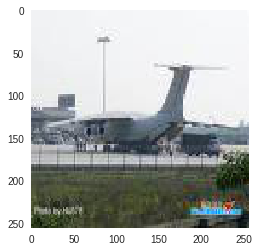

Original Label:False, Prediction:[[1.]]


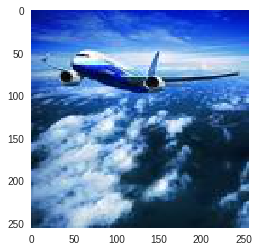

Original Label:False, Prediction:[[1.]]


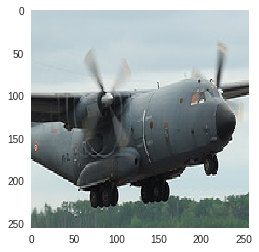

Original Label:False, Prediction:[[0.]]


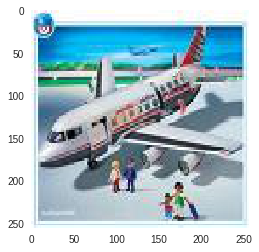

Original Label:False, Prediction:[[0.]]


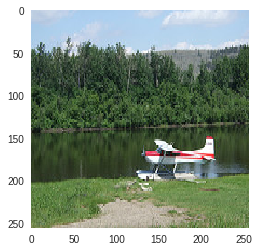

Original Label:False, Prediction:[[0.]]


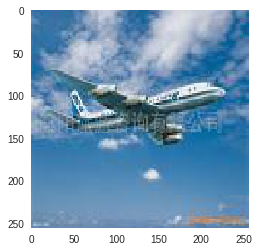

Original Label:False, Prediction:[[1.]]


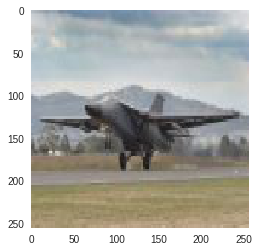

Original Label:False, Prediction:[[0.]]


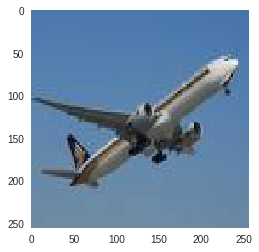

Original Label:False, Prediction:[[1.]]


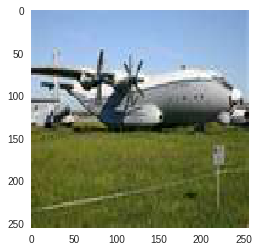

Original Label:False, Prediction:[[0.]]


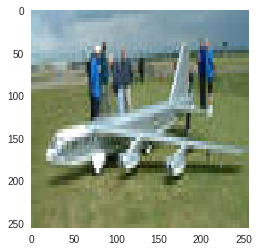

Original Label:False, Prediction:[[1.]]


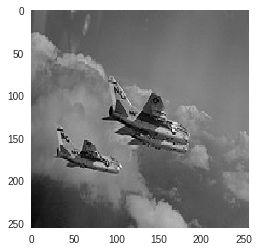

Original Label:False, Prediction:[[0.]]


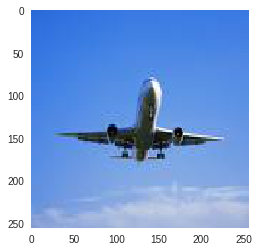

Original Label:False, Prediction:[[0.]]


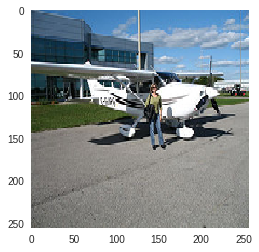

Original Label:False, Prediction:[[0.]]


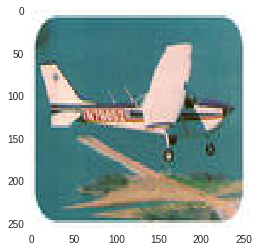

Original Label:False, Prediction:[[0.]]


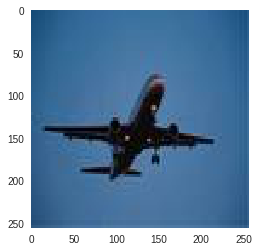

Original Label:False, Prediction:[[0.]]


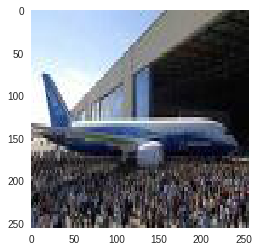

Original Label:False, Prediction:[[1.]]


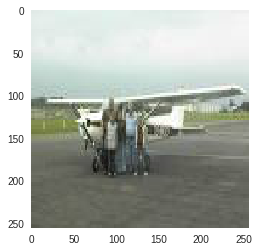

Original Label:False, Prediction:[[1.]]


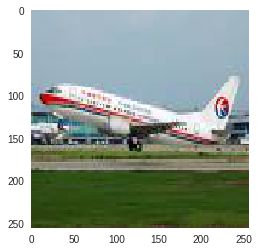

Original Label:False, Prediction:[[0.]]


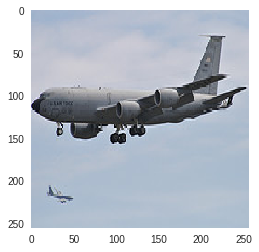

Original Label:False, Prediction:[[1.]]


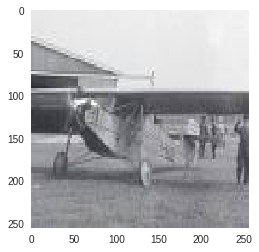

Original Label:False, Prediction:[[1.]]


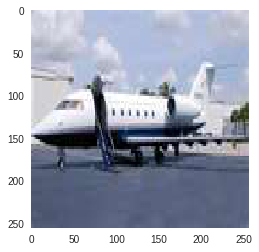

Original Label:False, Prediction:[[1.]]


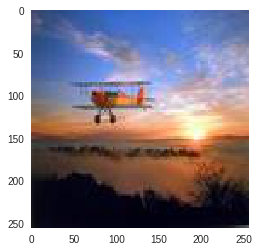

Original Label:False, Prediction:[[0.]]


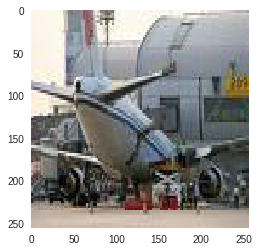

Original Label:False, Prediction:[[0.]]


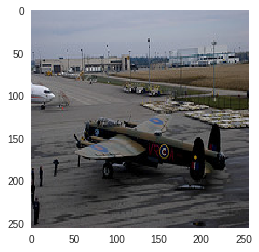

Original Label:False, Prediction:[[0.]]


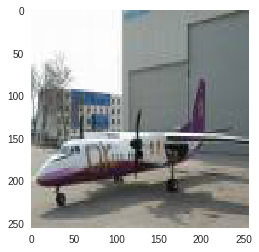

Original Label:False, Prediction:[[0.]]


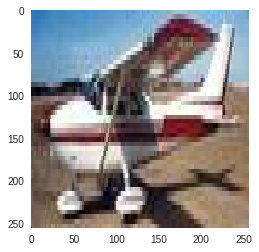

Original Label:False, Prediction:[[0.]]


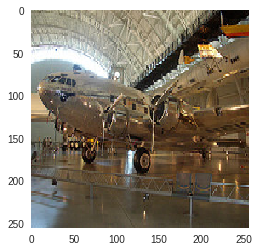

Original Label:False, Prediction:[[0.]]


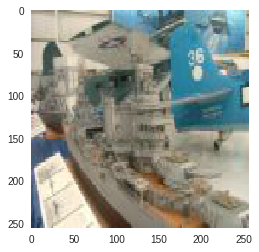

Original Label:False, Prediction:[[0.]]


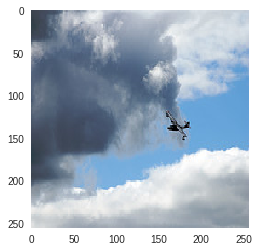

Original Label:False, Prediction:[[0.]]


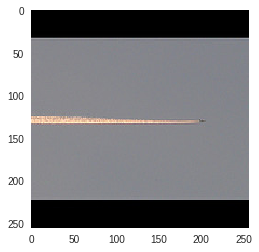

Original Label:False, Prediction:[[0.]]


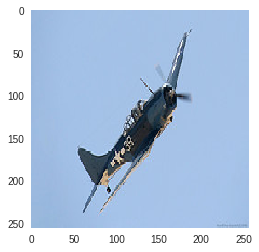

Original Label:False, Prediction:[[1.]]


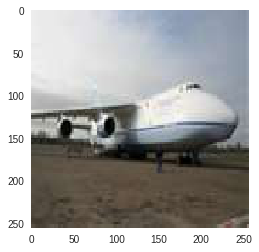

Original Label:False, Prediction:[[0.]]


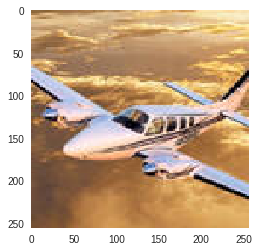

Original Label:False, Prediction:[[0.]]


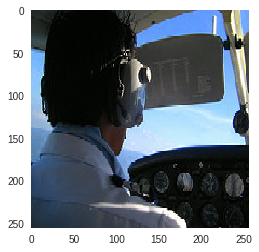

Original Label:False, Prediction:[[0.]]


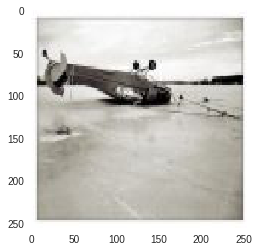

Original Label:False, Prediction:[[1.]]


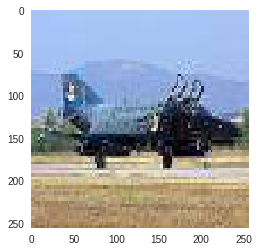

Original Label:False, Prediction:[[0.]]


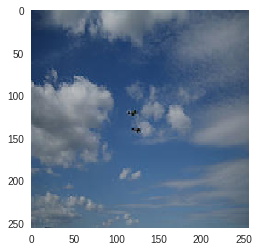

Original Label:False, Prediction:[[0.]]


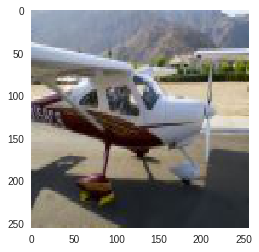

Original Label:False, Prediction:[[1.]]


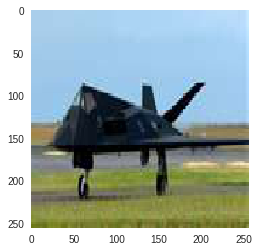

Original Label:False, Prediction:[[0.]]


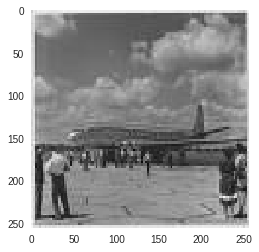

Original Label:False, Prediction:[[0.]]


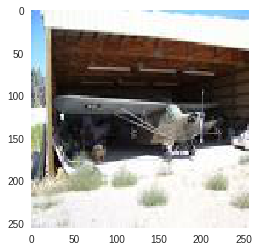

Original Label:False, Prediction:[[0.]]


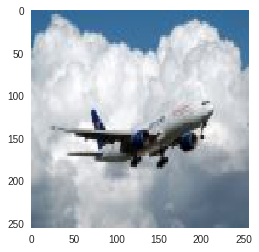

Original Label:False, Prediction:[[0.]]


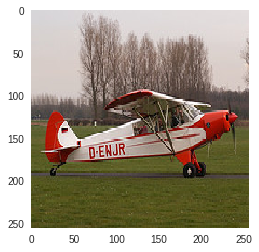

Original Label:False, Prediction:[[0.]]


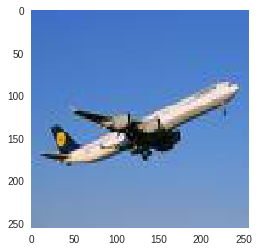

Original Label:False, Prediction:[[0.]]


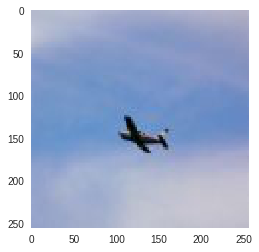

Original Label:False, Prediction:[[0.]]


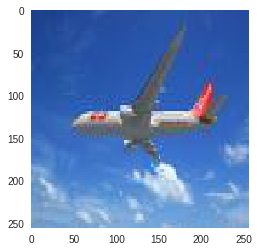

Original Label:False, Prediction:[[1.]]


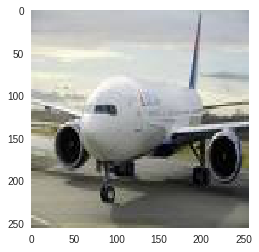

Original Label:False, Prediction:[[1.]]


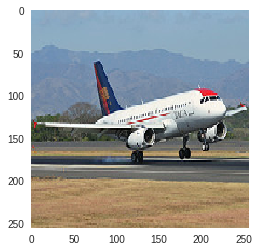

Original Label:False, Prediction:[[0.]]


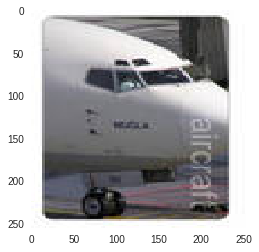

Original Label:False, Prediction:[[1.]]


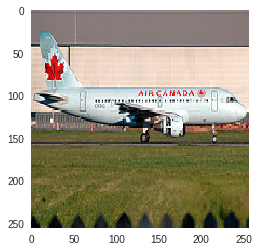

Original Label:False, Prediction:[[0.]]


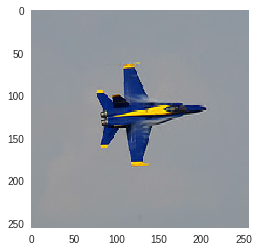

Original Label:False, Prediction:[[1.]]


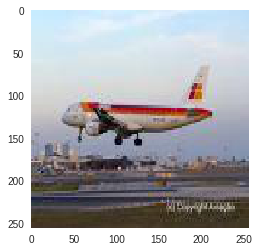

Original Label:False, Prediction:[[1.]]


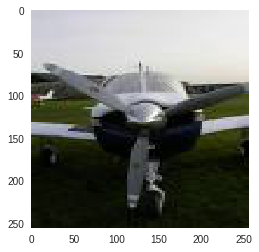

Original Label:False, Prediction:[[1.]]


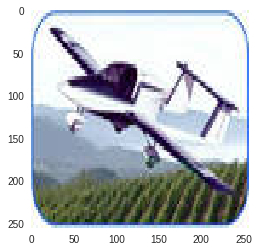

Original Label:False, Prediction:[[0.]]


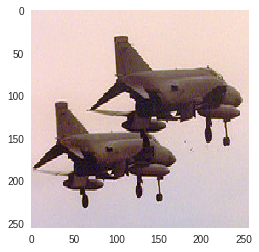

Original Label:False, Prediction:[[1.]]


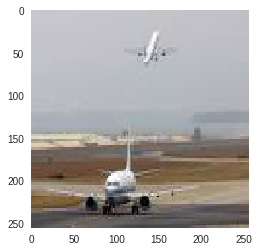

Original Label:False, Prediction:[[1.]]


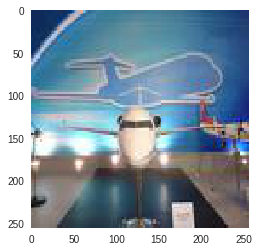

Original Label:False, Prediction:[[1.]]


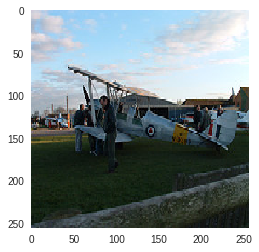

Original Label:False, Prediction:[[0.]]


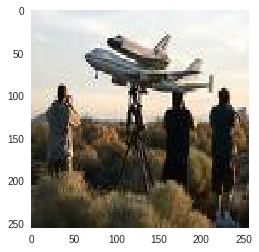

Original Label:False, Prediction:[[1.]]


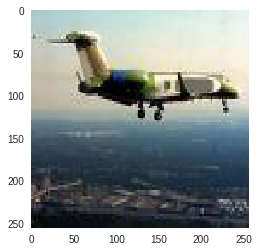

Original Label:False, Prediction:[[1.]]


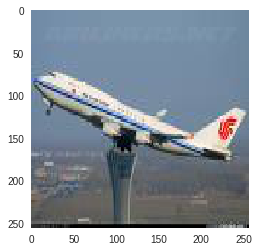

Original Label:False, Prediction:[[0.]]


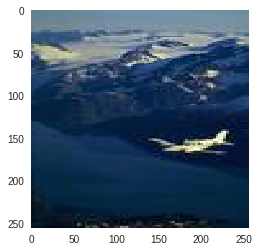

Original Label:False, Prediction:[[0.]]


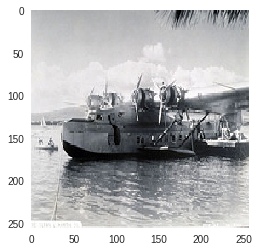

Original Label:False, Prediction:[[1.]]


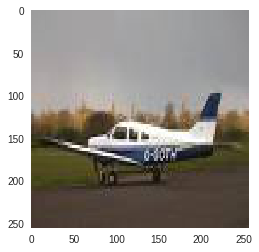

Original Label:False, Prediction:[[1.]]


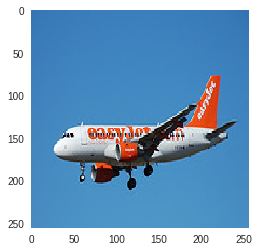

Original Label:False, Prediction:[[1.]]


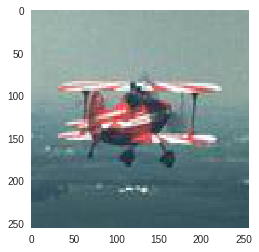

Original Label:False, Prediction:[[0.]]


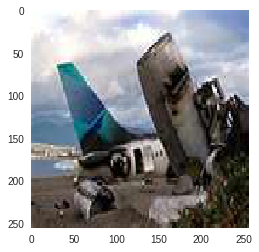

Original Label:False, Prediction:[[1.]]


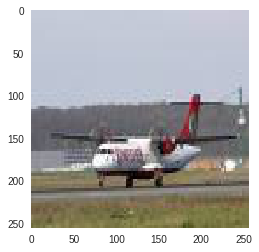

Original Label:False, Prediction:[[0.]]


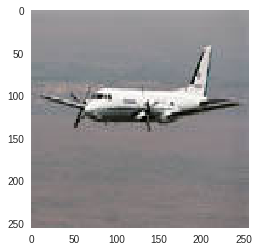

Original Label:False, Prediction:[[5.3211925e-34]]


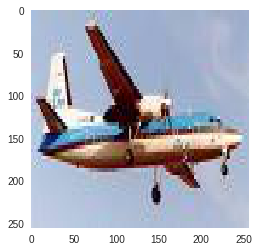

Original Label:False, Prediction:[[0.]]


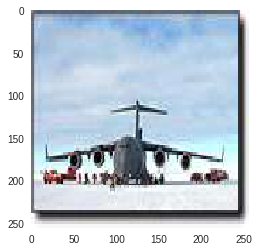

Original Label:False, Prediction:[[0.]]


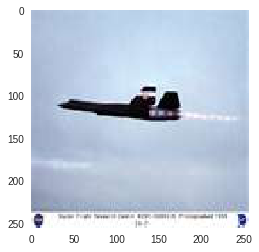

Original Label:False, Prediction:[[0.]]


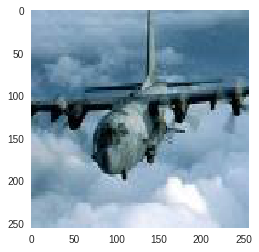

Original Label:False, Prediction:[[1.]]


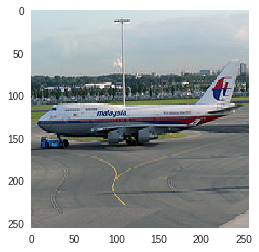

Original Label:False, Prediction:[[1.]]


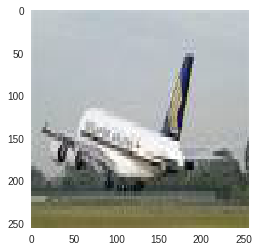

Original Label:False, Prediction:[[1.]]


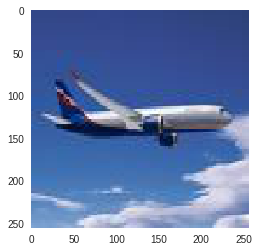

Original Label:False, Prediction:[[0.]]


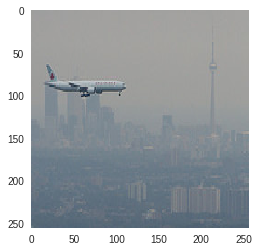

Original Label:False, Prediction:[[1.]]


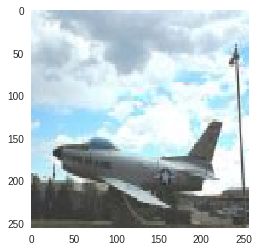

Original Label:False, Prediction:[[0.]]


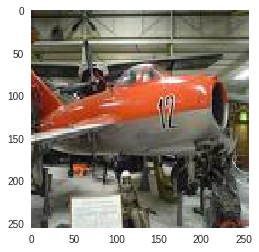

Average classification time: 0.134166


In [26]:
import time

def classify_image(image_data):
  n = image_data.shape[0]
  im_mat = np.asarray(image_data).reshape(n,256,256,3)
  features = inc_conv.predict(im_mat).reshape(n,6*6*1536)
  return model.predict(features)

N = 100;

# Make some examples
sats = np.random.randint(0,n_sat,N)
spaces = np.random.randint(0,n_space,N)

ex_list = ([sat_dir + f for f in np.array(sat_l)[sats]] + 
           [neg_dir + f for f in np.array(neg_l)[spaces]])

dt=0;

for i in range(2*N):
  im = Image.open(ex_list[i]).resize((256,256)).convert("RGB")
  im = np.array(im).reshape(1,256,256,3)
  t0 = time.time();
  prediction = classify_image(im)
  dt += time.time()-t0;
  print("Original Label:{:}, Prediction:{}".format(i<10,prediction))
  plt.imshow(im[0])
  plt.grid('off')
  plt.show()
  

print("Average classification time: {:8g}".format(dt/(2*N)))

In [0]:
from google.colab import files

model.save('prototype.h5')

files.download('prototype.h5')

In [0]:
files.download('prototype.h5')

In [16]:
print(os.popen('ls').read())

planes
prototype.h5
sample_data
sats

